In [1]:
%%bash
wget -O transformer-memorization-sampled.zip --no-check-certificate "https://drive.google.com/u/0/uc?id=11JXplGZj1l1RYz_nSBcrmRjLdVrza-No&export=download&confirm=t"
unzip -q transformer-memorization-sampled.zip

--2023-01-03 02:12:42--  https://drive.google.com/u/0/uc?id=11JXplGZj1l1RYz_nSBcrmRjLdVrza-No&export=download&confirm=t
Resolving drive.google.com (drive.google.com)... 142.250.153.113, 142.250.153.102, 142.250.153.101, ...
Connecting to drive.google.com (drive.google.com)|142.250.153.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://drive.google.com/uc?id=11JXplGZj1l1RYz_nSBcrmRjLdVrza-No&export=download&confirm=t [following]
--2023-01-03 02:12:42--  https://drive.google.com/uc?id=11JXplGZj1l1RYz_nSBcrmRjLdVrza-No&export=download&confirm=t
Reusing existing connection to drive.google.com:443.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-2s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/cc7oq5mc3od2g570jm1svrv4rm6paq50/1672711950000/18342284266696837366/*/11JXplGZj1l1RYz_nSBcrmRjLdVrza-No?e=download&uuid=72a1f6dc-dd6a-47c2-913f-0a26f8dfb8ce [following]
--2023-01-03 02:12:42--  https://d

# Memorization
- Consider a set of tokens
- Divide them into context tokens & true continuation
- Greedily generate as number of tokens as true continuation
- Memorization Accuracy = accuracy(generated tokens, true continuation)

# Training order and Memorization
- Tokenized training corpus consists of sequences of 2048 tokens
- We take first 64 tokens from each sequence, compute memorization accuracy
- Our data is thus time Series accuracy measurements where time represents index of Sequence

# Methodology
- We evaluate 7 checkpoints per model, spaced evenly
- This evaluation is only on data the model has seen
- Total Sequences evaluated: 146M
- Total Tokens evaluated: 300B

# Dataset Structure
- The evaluations you have downloaded are highly sampled (0.1%) of original data
- Evaluations are Pandas DataFrames with 3 individual columns: [ index, accuracy, nll_loss ]
    - These should be stored in `cwd/transformer-memorization-sampled/memorization_results_{model}-{checkpoint}.csv`
- Evaluations contain three columns
    - **index**: Sequence Index of an evaluated sequence
    - **accuracy**: Memorization Accuracy of an evaluated sequence
    - **nll_loss**: **[ Not Used ]** Negative logarithmic loss of generated logits
- Dataset `memorization_results` is a dictionary that maps checkpoints to their corresponding Evaluations

In [2]:
import os
import pandas as pd

models = ['19M', '125M', '350M', '800M', '1.3B', '2.7B', '6.7B', '13B']
checkpoints = ['23M', '44M', '65M', '85M', '105M', '126M', '146M']

memorization_results = {}
folderpath = os.path.join(os.getcwd(), 'transformer-memorization-sampled')
for model in models:
    for checkpoint in checkpoints:
        modelpath = os.path.join(folderpath, f'memorization_results_{model}-{checkpoint}.csv')
        memorization_results[f'{model}-{checkpoint}'] = pd.read_csv(modelpath)
        memorization_results[f'{model}-{checkpoint}'].sort_values(by='index', inplace=True)

# Lets have a look at 13B-146M to get an idea of what the data looks like
memorization_results[f'13B-146M'].head()

,index,nll_loss,accuracy
0,195,-5.711552,0.03125
1,476,-6.527090,0.00000
2,798,-5.492241,0.18750
3,967,-4.349491,0.09375
4,978,-3.941576,0.00000


# Lines of best fit
- Plots the regression lines with confidence intervals and stores regression metrics in a csv.
- Inputs:
    - **model**: Name of the model plotted
    - **checkpoint**: Checkpoint of the model plotted
    - **most memorized percentile**: `percentile` parameter of the current function

- If L(x, p) denotes the line of best fit for model p at Sequence Index x, then we store
    - **slope**: Defined as [L(x_max, p) - L(0, p)] / x_max
    - **variation**: Total variation, defined as L(x_max, p) - L(0, p)
    - **% change**: Percentage change induced by variation, defined as [L(x_max, p) - L(0, p)]/L(0, p)

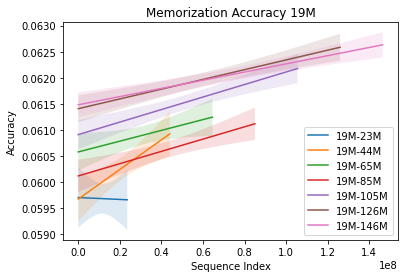

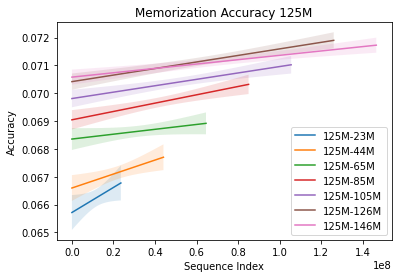

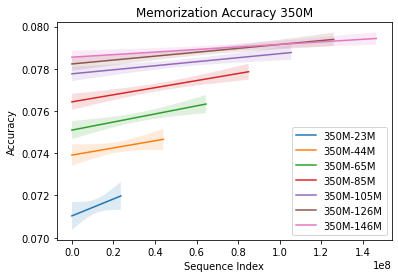

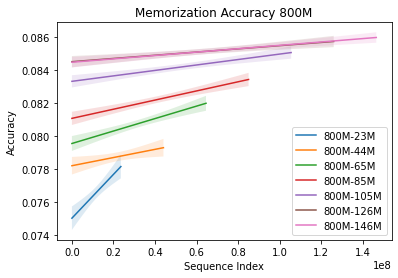

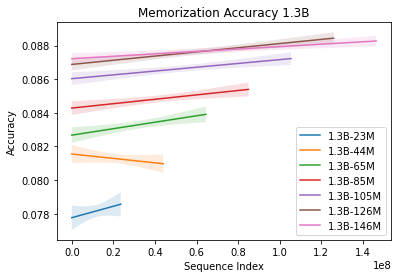

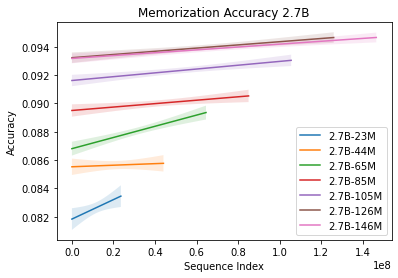

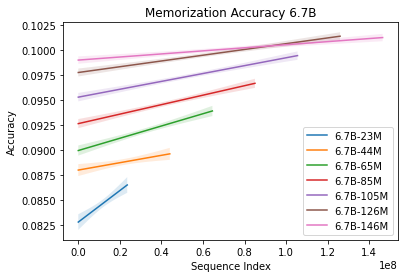

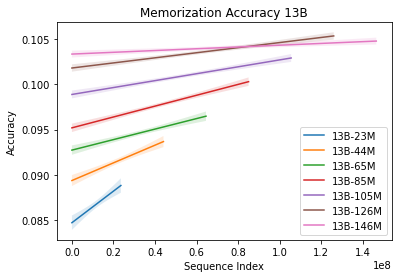

In [3]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

def plot_linear_regression_of_checkpoint(model_name, evals, axis, percentile = 0):
    '''Generates a linear regression plot and returns a tuple of results
    
    `model_name`: String with model and it's checkpoint
    `evals`: Evaluation results of corresponding model on corresponding checkpoint
    `axis`: Plotting params
    `percentile`: Sample only Indicies with accuracy more than or equal to k percentile accuracy
    
    Returns:
        tuple(
            slope: slope of regression line
            variation: Total variation, defined above
            % change: percentage change induced by variation, defined above
        )
    '''
    # Top percentile evals
    top_percentile_accuracy = np.percentile(evals['accuracy'],percentile)
    top_percentile_evals = evals[evals['accuracy'] >= top_percentile_accuracy]
    
    # Actually performing regression
    indicies, accuracy = top_percentile_evals['index'], top_percentile_evals['accuracy']
    
    # Fitting a line, a is slope and b is y-intercept
    a,b = np.polyfit(indicies, accuracy,1)
    acc_best_fit = a*indicies+b
    results = (
        a, # Slope
        acc_best_fit.iloc[-1] - acc_best_fit.iloc[0], # Variation
        (acc_best_fit.iloc[-1] - acc_best_fit.iloc[0])*100/acc_best_fit.iloc[0] # % change
    )
    
    # Confidence Interval plots
    y_model = np.polyval([a, b], indicies)
    x_mean = indicies.mean()
    y_mean = accuracy.mean()
    dof = len(indicies) - 2 # Degrees of freedom
    t = stats.t.ppf(0.90, dof)  # 90% confidence
    residual = accuracy - y_model
    std_error = (np.sum(residual**2) / dof)**.5
    x_line = np.linspace(np.min(indicies), np.max(indicies), int(1e6))
    y_line = np.polyval([a, b], x_line)
    ci = t * std_error * (1/len(indicies) + (x_line - x_mean)**2 / np.sum((indicies - x_mean)**2))**.5
    
    # Actually plotting data
    axis.plot(x_line, y_line, label=model_name)
    axis.fill_between(x_line, (y_line-ci), (y_line+ci), alpha=0.15)
    return results

for model in models:
    fig, axis = plt.subplots()
    
    # All data
    for checkpoint in checkpoints:
        model_name = f'{model}-{checkpoint}'
        evals = memorization_results[model_name]
        plot_linear_regression_of_checkpoint(model_name, evals, axis, 0)
    
    plt.title(f"Memorization Accuracy {model}")
    plt.xlabel("Sequence Index")
    plt.ylabel("Accuracy")
    axis.legend(loc='lower right')
    plt.show()

- Note that plots with non-sampled data have slightly different regression lines and much lower width of confidence interval (Since an increase in sample size decreases sample error)

In [4]:
import seaborn as sns
import numpy as np
from matplotlib.colors import LogNorm
        

def scatter_plot_of_checkpoint(model, checkpoint):
    '''Plots accuracy distribution on marginal axes and Scatter plot on joint axis
    
    Note that the colormap of scatter plot is log normalized
    `model`: Model name
    `checkpoint`: Checkpoint of the corresponding model
    '''
    # Theming
    sns.set_theme(font_scale=1.5)
    model_name = f'{model}-{checkpoint}'
    
    # Extract Data
    evals = memorization_results[model_name].sample(frac=0.1)
    evals['Accuracy'] = evals['accuracy']
    evals['Sequence Index'] = evals['index']
    
    # Binning
    bins = pd.cut(evals['Accuracy'], bins=32)
    counts = evals.groupby(bins)['index'].count().reset_index()
    
    # Map binning counts to each row
    evals['acc_bin_counts'] = bins.apply(lambda x:counts[
        counts['Accuracy'] == x]['index'].iloc[0]).astype('int32')
    
    # Calculate distribution of values
    acc_density = evals['acc_bin_counts']/evals['acc_bin_counts'].max()
    
    # Plotting
    grid = sns.JointGrid(
        data = evals, 
        x = 'Sequence Index', 
        y = 'Accuracy', 
        height = 8, 
        ratio = 3, 
        space = 0.1, 
        marginal_ticks = True,
        hue = acc_density.to_numpy(), 
        hue_norm = LogNorm(),
        palette = 'viridis',
    )
    
    # Scatter plot
    grid.plot_joint(
        sns.scatterplot,
        legend=False
    )
    
    # Histograms
    grid.plot_marginals(sns.histplot, fill=True, alpha=1, stat='probability', bins=32)
    
    # Labeling figure
    fig  = grid.figure
    fig.suptitle(f"{model_name} Memorization Accuracy", fontsize=20)
    fig.tight_layout()
    fig.subplots_adjust(top=0.90)
    plt.show()

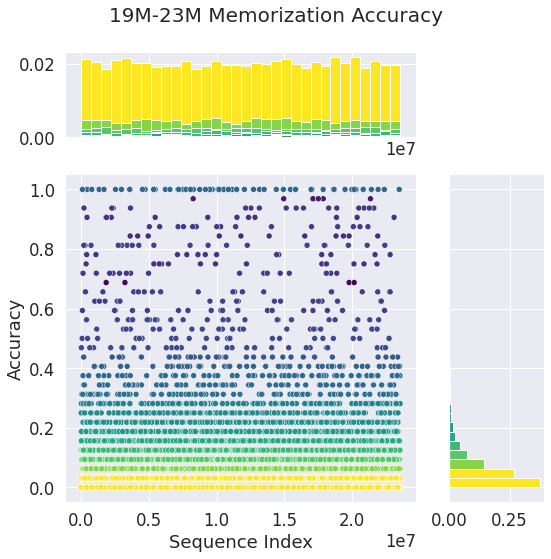

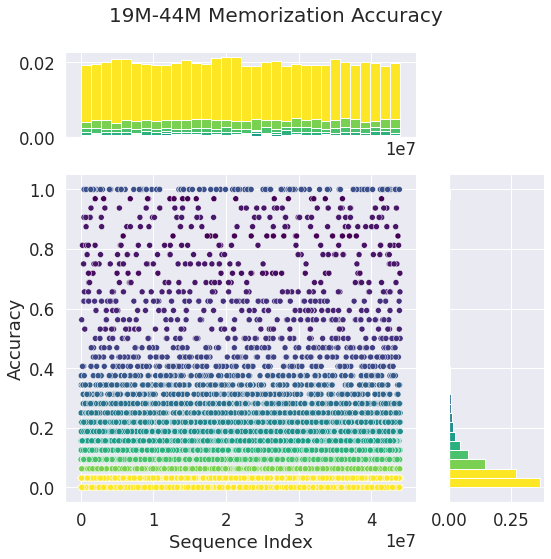

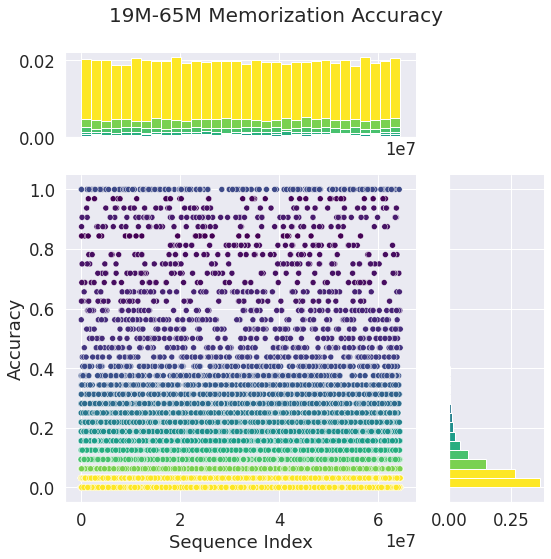

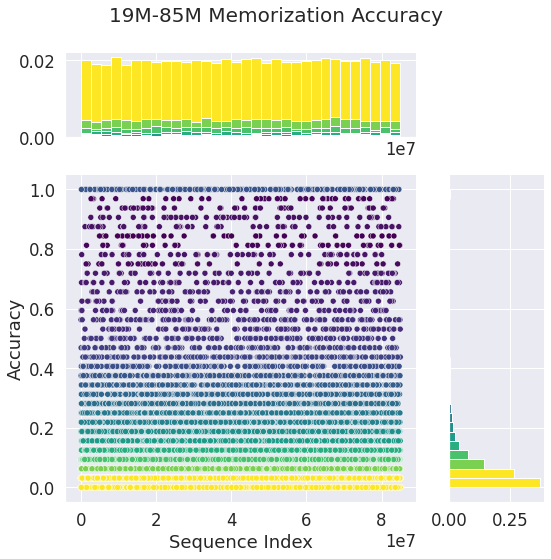

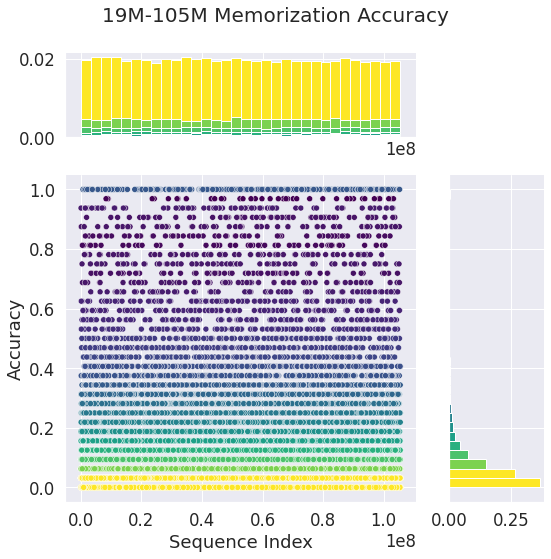

...

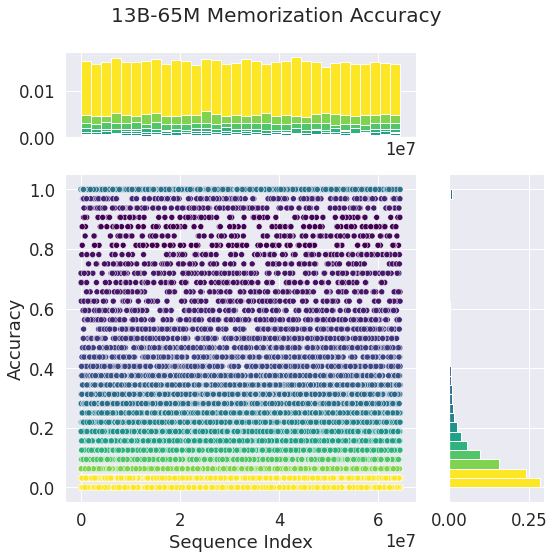

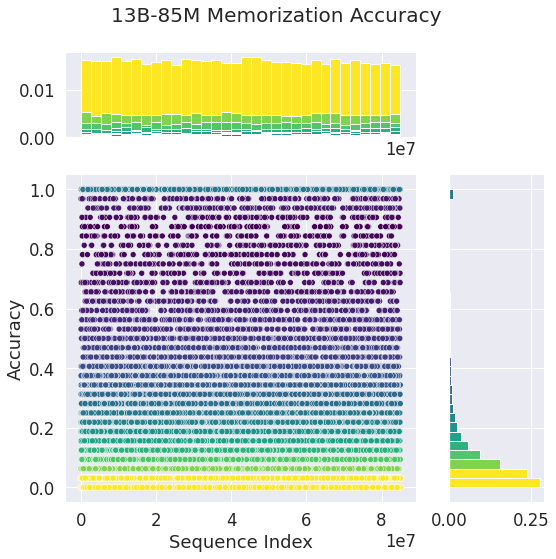

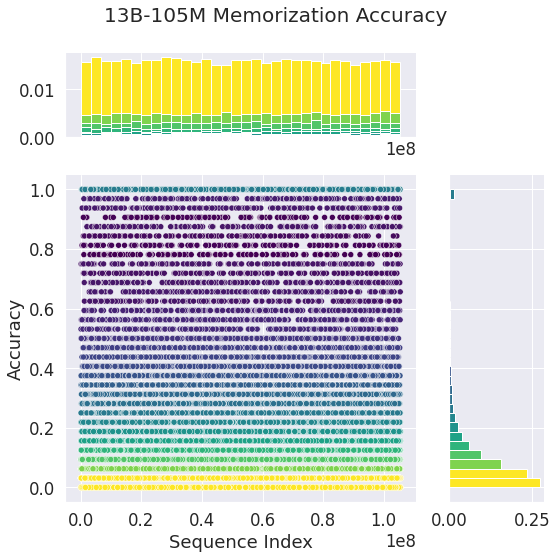

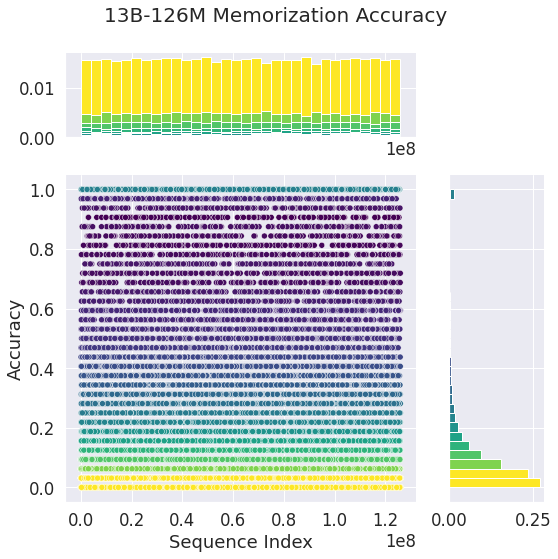

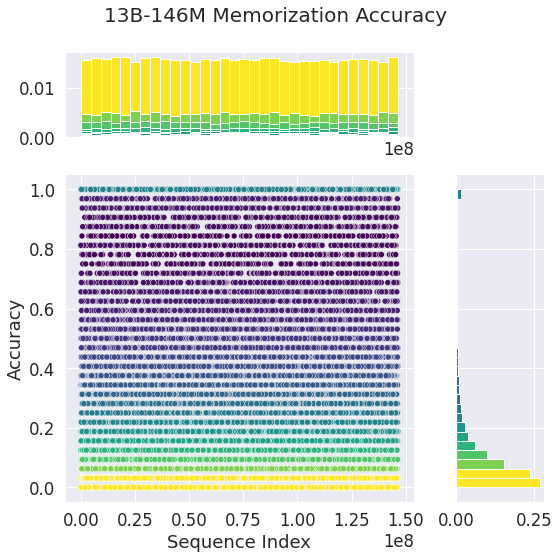

In [5]:
for model in models:
    for checkpoint in checkpoints:
        scatter_plot_of_checkpoint(model, checkpoint)

# Model correlation plots

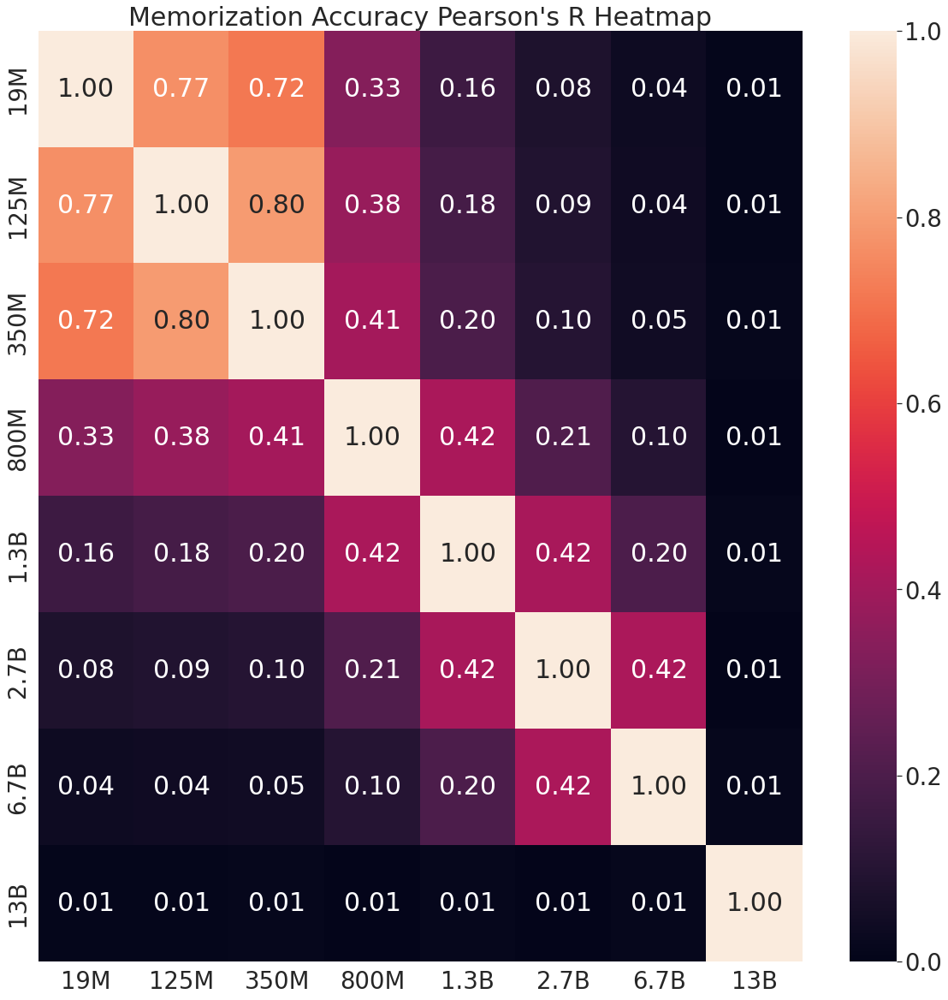

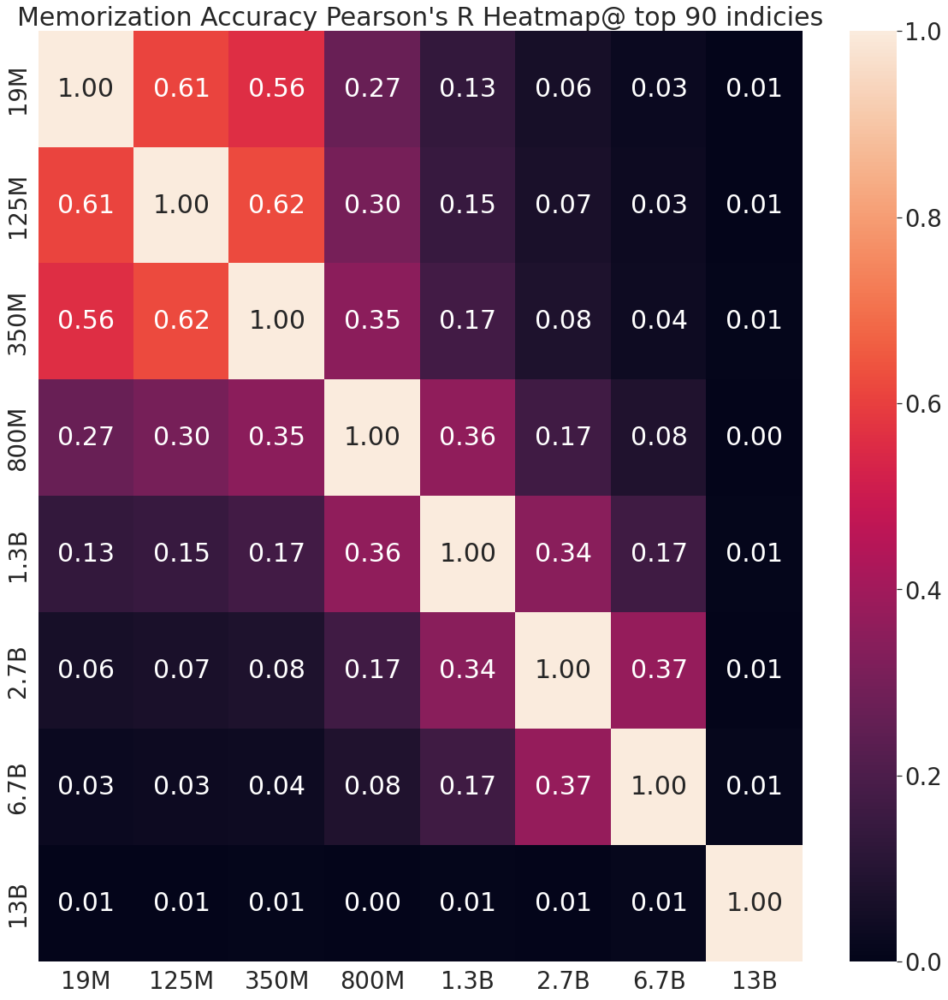

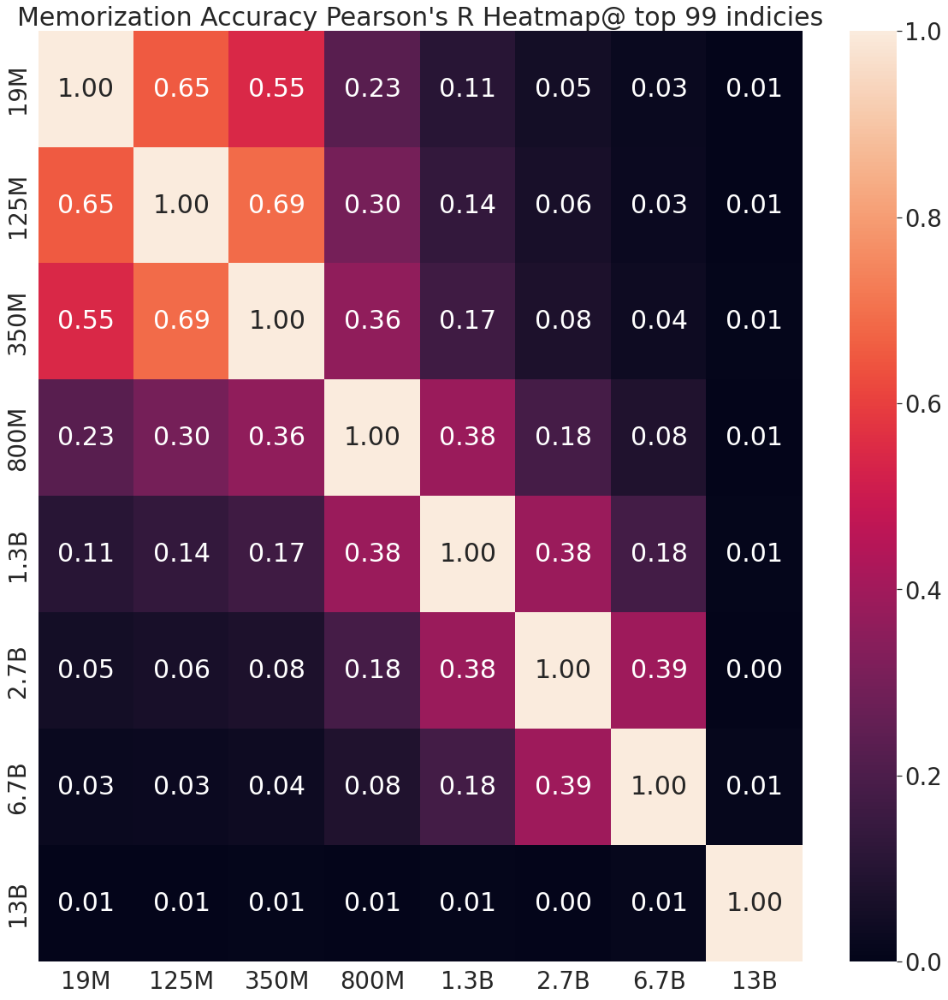

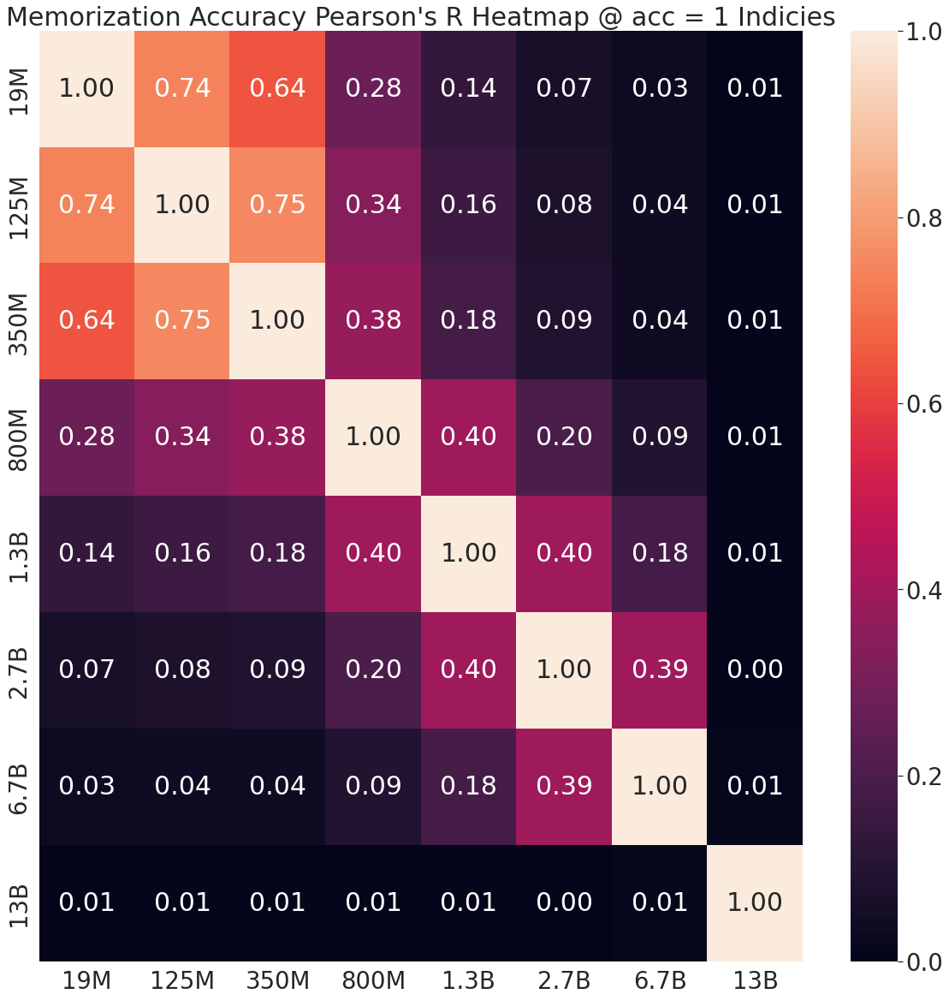

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def correlation_heatmap_of_models(percentile=0):
    '''Plots Pearson'R correlation between models
    
    `percentile`: Most memorized data percentile
    '''
    # Theming
    sns.set_theme(font_scale=2.5)
    plt.rcParams["figure.figsize"] = (20,20)
    
    # We will use df.corr() to get correlations.
    # So, we are grouping all model's last checkpoint memorization accuracies into a single dataframe
    df = pd.DataFrame()
    for model in models:
        df[model] = memorization_results[f'{model}-146M']['accuracy']
    
    # Extract top percentile evals if specified
    for model in models:
        if percentile > 1:
            top_percentile_acc = np.nanpercentile(df[f'{model}'],percentile)
            df[f'{model}'] = df[f'{model}'] >= top_percentile_acc
            df[f'{model}'] = df[f'{model}'].astype('float32')
        if percentile == 1:
            df[f'{model}'] = df[f'{model}'] == 1
            df[f'{model}'] = df[f'{model}'].astype('float32')
    
    # Get correlation
    correlation = df.corr()
    
    # Heatmap we add annotations to also indicate value of pearson's R
    sns.heatmap(correlation, annot=True, fmt='.2f', vmin=0, vmax=1)
    title = "Memorization Accuracy Pearson's R Heatmap"
    if percentile == 1:
        title += f" @ acc = 1 Indicies"
    elif percentile > 0:
        title += f"@ top {percentile} indicies"
    plt.title(title)
    plt.show()

correlation_heatmap_of_models()
correlation_heatmap_of_models(90)
correlation_heatmap_of_models(99)
correlation_heatmap_of_models(1)

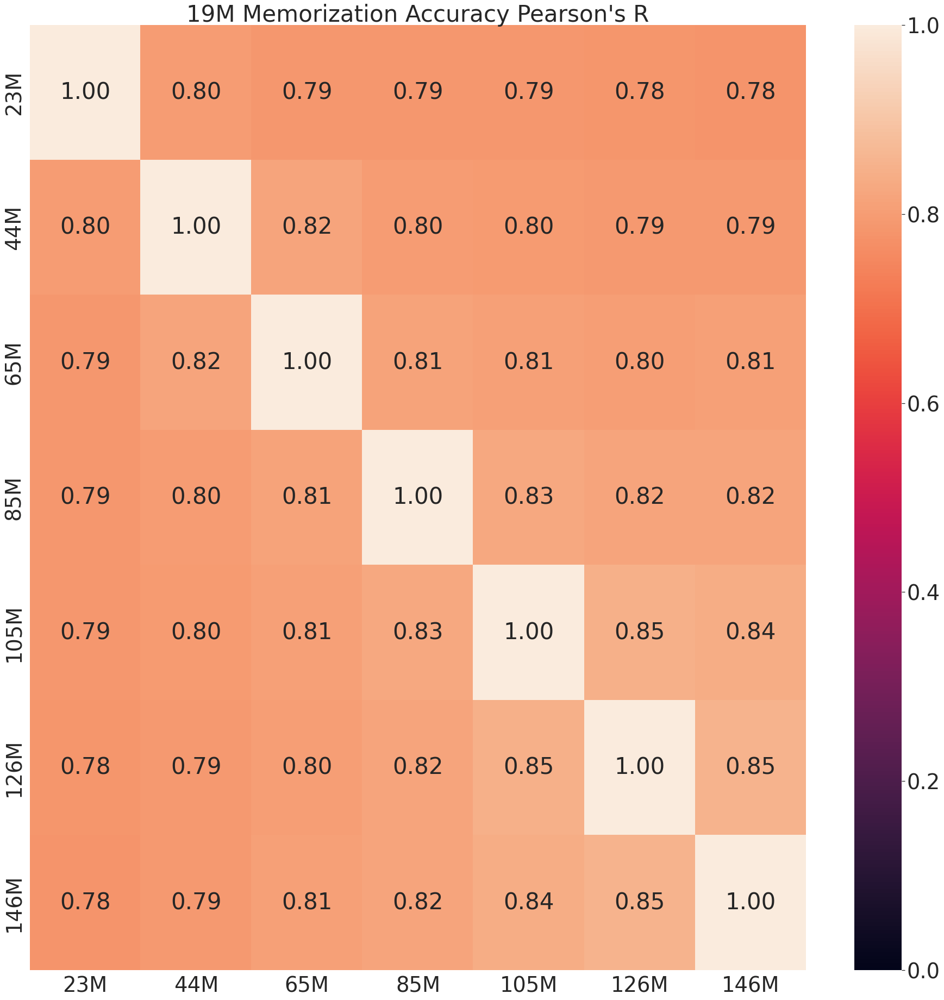

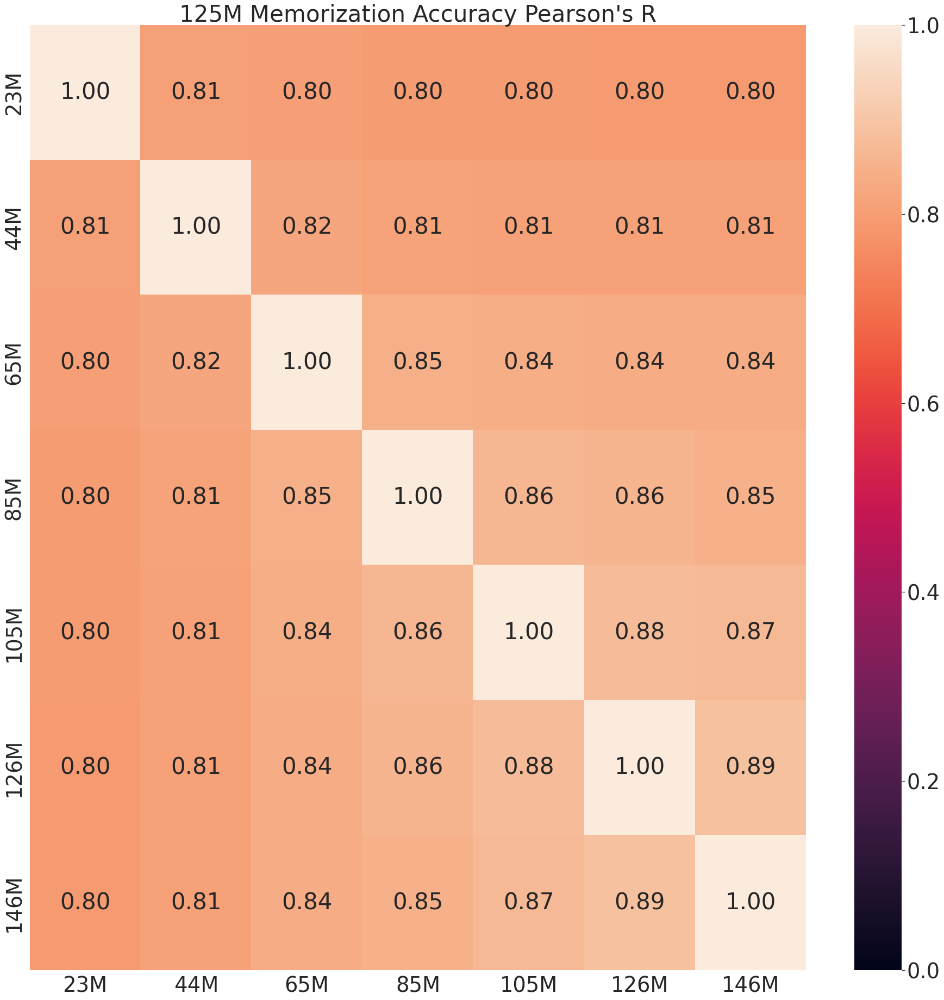

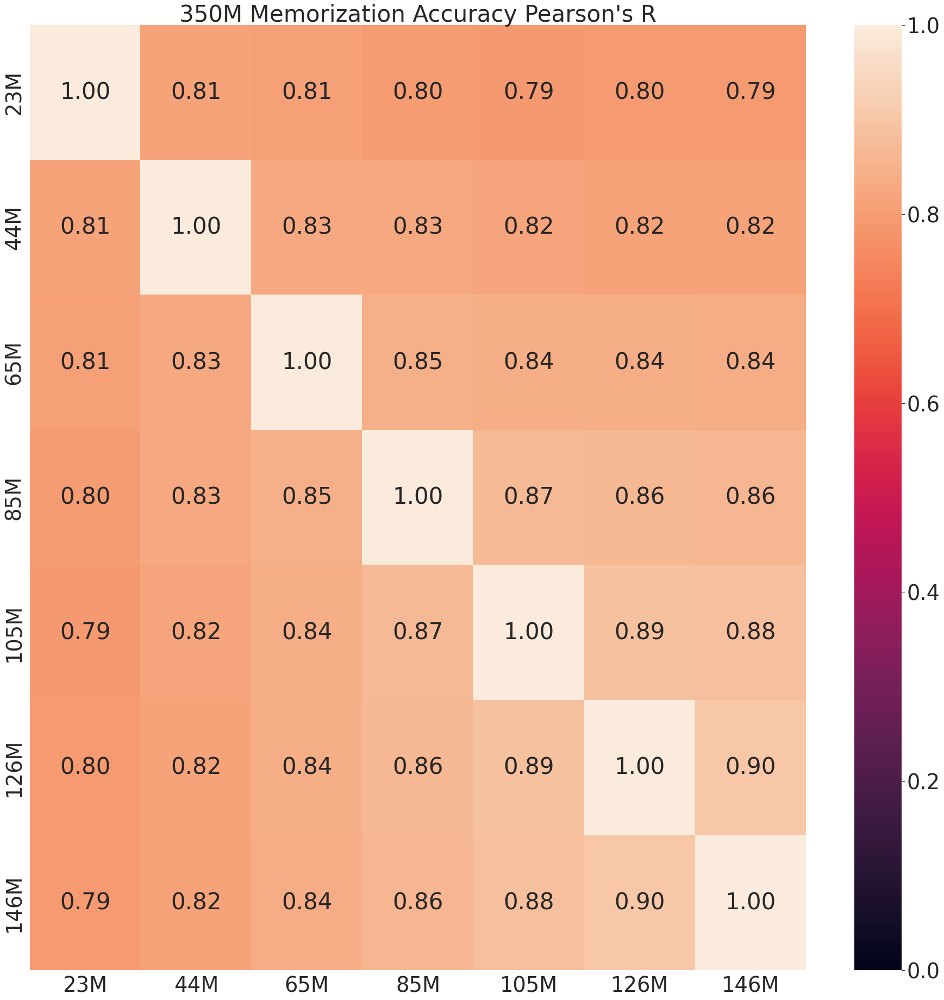

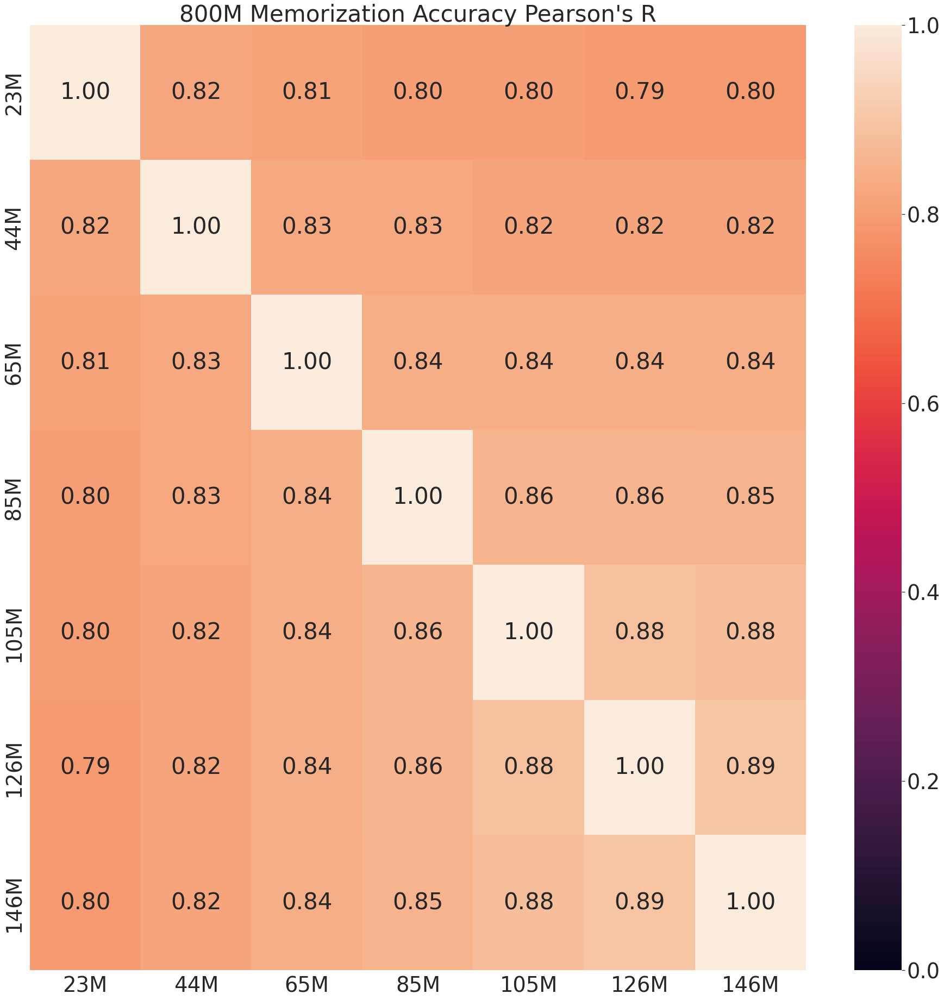

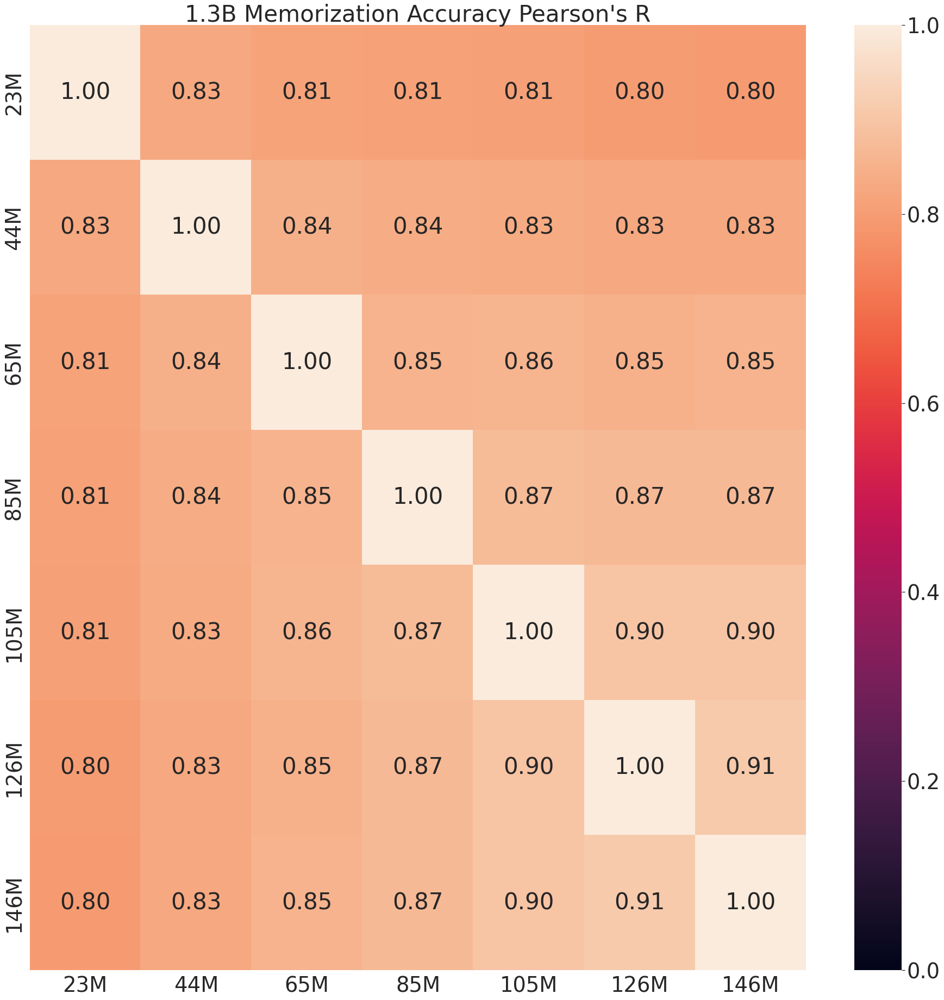

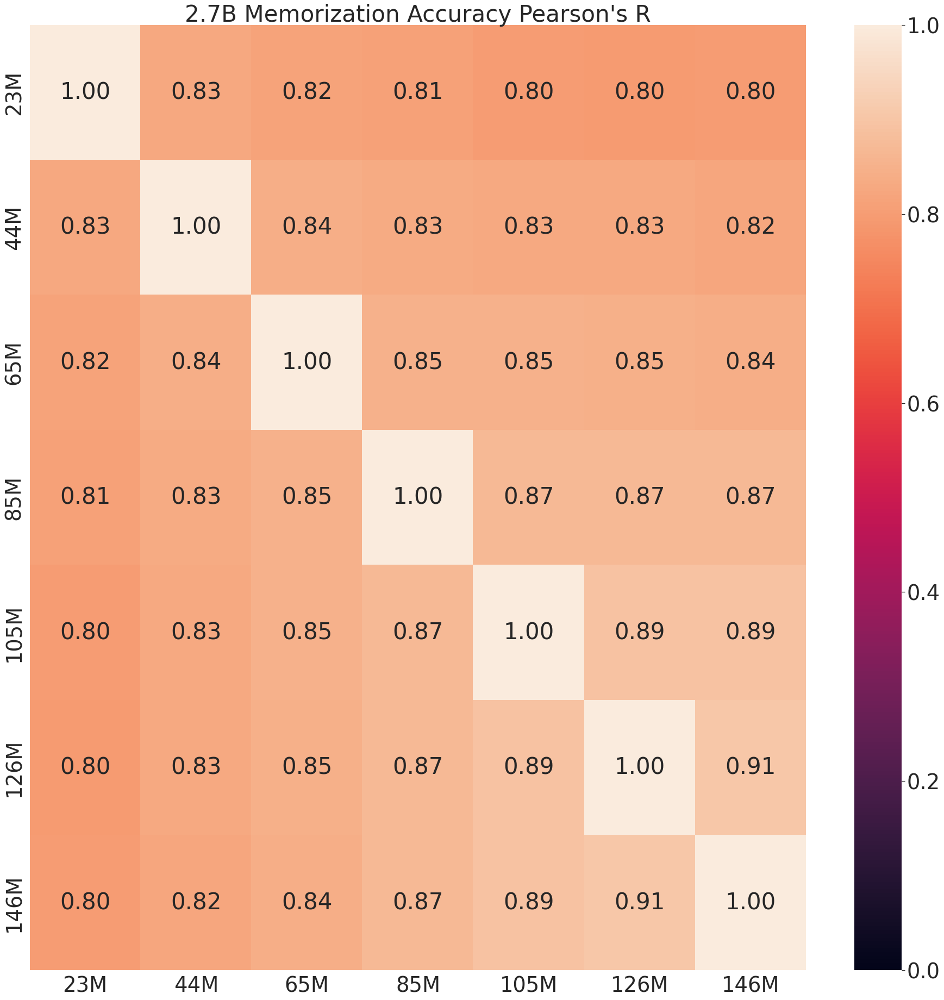

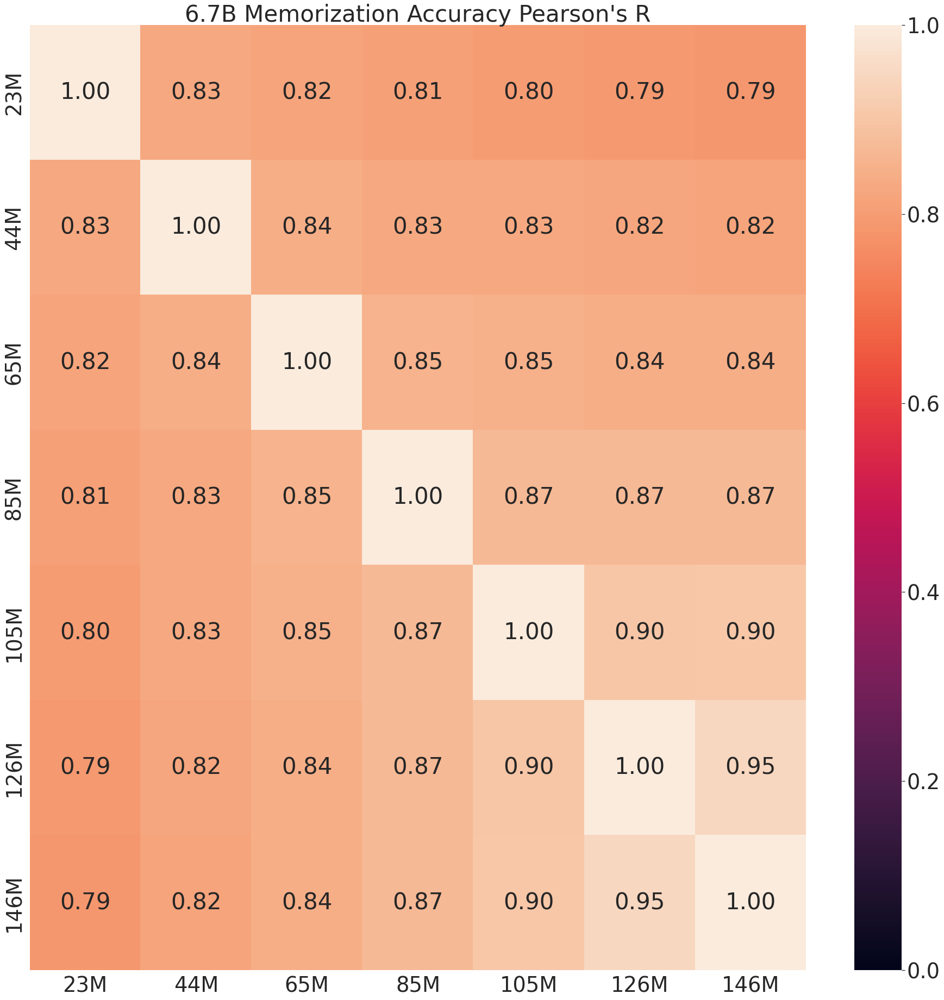

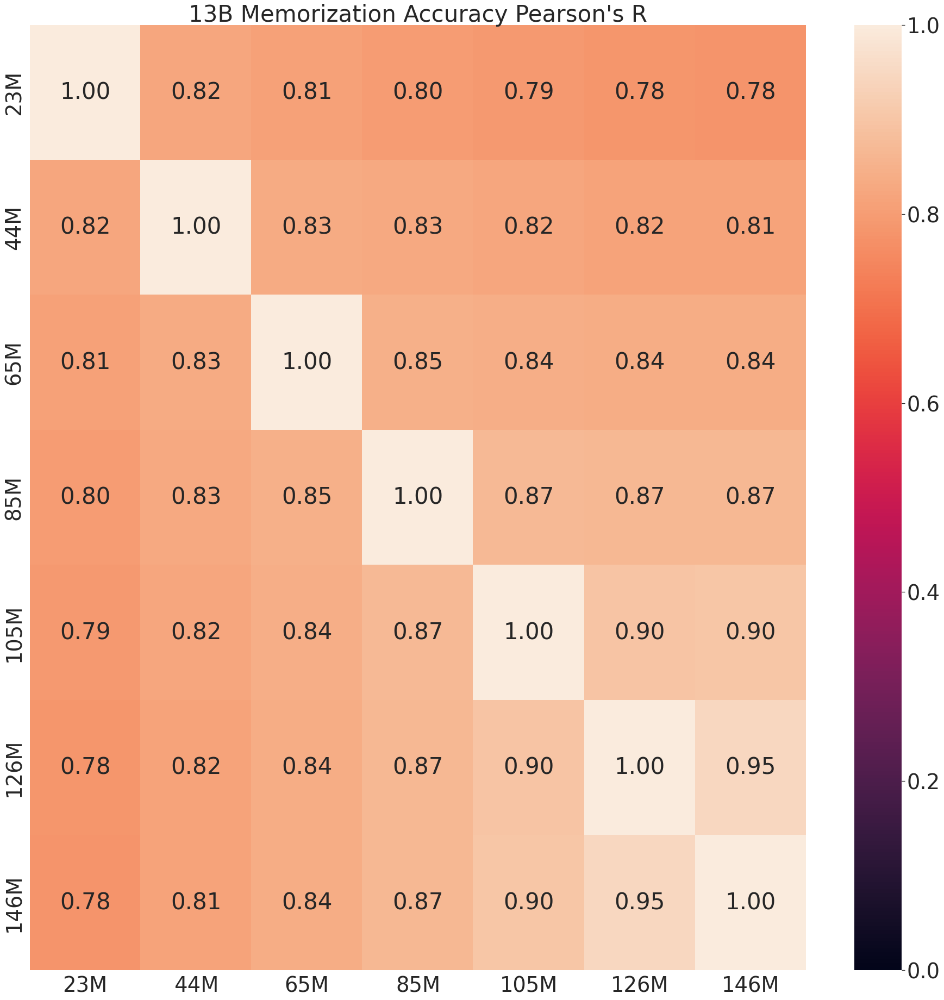

In [7]:
def plot_correlation_heatmap_of_checkpoint(model):
    '''Plots Pearson'R correlation between models
    
    `model`: Model to plot correlation of
    '''
    # Theming
    sns.set_theme(font_scale=3.5)
    plt.rcParams["figure.figsize"] = (32,32)
    
    # We will use df.corr() to get correlations.
    # So, we are grouping all model's last checkpoint memorization accuracies into a single dataframe
    df = pd.DataFrame()
    
    # We only consider Sequence indicies that are evaluated by all checkpoints
    max_sequence_index = 23000*1024
    for checkpoint in checkpoints:
        evals = memorization_results[f'{model}-{checkpoint}']
        evals = evals[evals['index'] <= max_sequence_index]
        df[checkpoint] = evals['accuracy']
    
    # Get correlation
    correlation = df.corr()
    
    # Heatmap we add annotations to also indicate value of pearson's R
    sns.heatmap(correlation, annot=True, fmt='.2f', vmin=0, vmax=1)
    title = f"{model} Memorization Accuracy Pearson's R"
    plt.title(title)
    plt.show()

for model in models:
    plot_correlation_heatmap_of_checkpoint(model)

In [8]:
# import matplotlib.pyplot as plt
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# def plot_confusion_matrix_predicting_large_model_memorization(checkpoint):
#     df = pd.DataFrame()
#     # We only consider Sequence indicies that are evaluated by all checkpoints
#     for idx, model in enumerate(models):
#         evals = memorization_results[f'{model}-{checkpoint}']
#         df[model] = evals['accuracy'] == 1

#     for model in models:
#         matrix = confusion_matrix(df[model], df['13B'])
#         disp = ConfusionMatrixDisplay(confusion_matrix=matrix)
#         disp.plot()
#         title = f"{model} Memorization Confusion Matrix"
#         plt.title(title)
#         plt.show()

# plot_confusion_matrix_predicting_large_model_memorization("146M")

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def confusion_matrix_predicting_late_memorization(models, checkpoints):

    cm_rate_df = pd.DataFrame(
        data={
            "checkpoint": [],
            "model": [],
            "TP": [],
            "FP": [],
            "FN": [],
            "TN": [],
            "TPR": [],
            "FPR": [],
            "FNR": [],
        }
    )

    # We only consider Sequence indicies that are evaluated by all checkpoints
    max_sequence_index = 23000*1024
    for model in models:

        evals = memorization_results[f'{model}-146M']
        evals = evals[evals['index'] <= max_sequence_index]
        ground_truth_146M = evals['accuracy'] == 1
        
        for checkpoint in checkpoints:
            evals = memorization_results[f'{model}-{checkpoint}']    
            evals = evals[evals['index'] <= max_sequence_index]
            prediction = evals['accuracy'] == 1
        
            matrix = confusion_matrix(prediction, ground_truth_146M, labels=[1,0])
            matrix = matrix.transpose()

            TP = matrix[0][0]
            FP = matrix[0][1]
            FN = matrix[1][0]
            TN = matrix[1][1]

            cm_rate_df = cm_rate_df.append(
                {
                    "checkpoint": checkpoint,
                    "model": model,
                    "TP": TP,
                    "FP": FP,
                    "FN": FN,
                    "TN": TN,
                    "TPR": TP/(TP+FN),
                    "FPR": FP/(FP+TN),
                    "FNR": FN/(FN+TP),
                },
                ignore_index=True
            )

    return cm_rate_df

    # df = confusion_matrix_predicting_late_memorization("19M")
    # def plot_confusion_matrix_predicting_late_memorization(model)
    #     for checkpoint in checkpoints:
    #         matrix = confusion_matrix(df[checkpoint], df['146M'], labels=[1,0])
    #         matrix = matrix.transpose()
    #         disp = ConfusionMatrixDisplay(confusion_matrix=matrix, display_labels=[1,0])
    #         disp.plot()
    #         title = f"{checkpoint} Predicts 146M"
    #         plt.title(title)
    #         plt.xlabel('True Label')
    #         plt.ylabel('Predicted Label')
    #         plt.show()
    #         # break

    # plot_confusion_matrix_predicting_late_memorization("19M")

In [10]:
df = confusion_matrix_predicting_late_memorization(models, checkpoints[:-1])

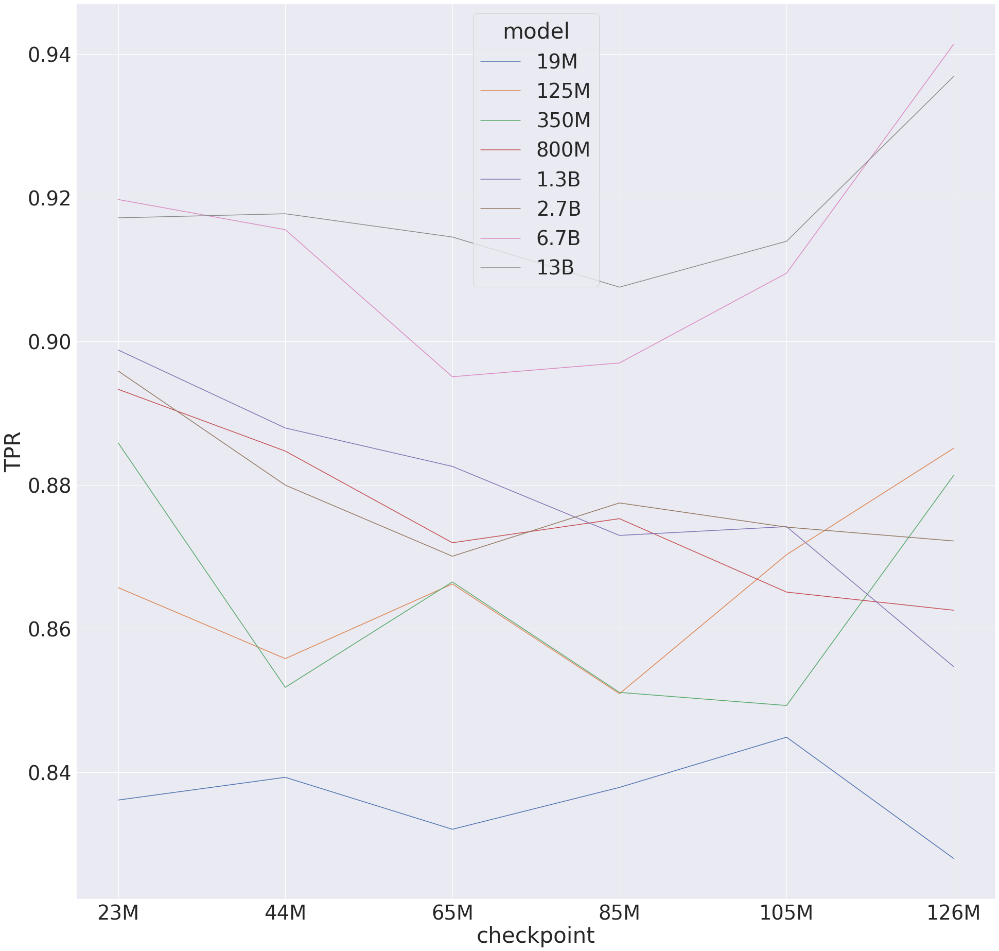

In [11]:
sns.lineplot(data=df, x="checkpoint", y="TPR", hue="model")

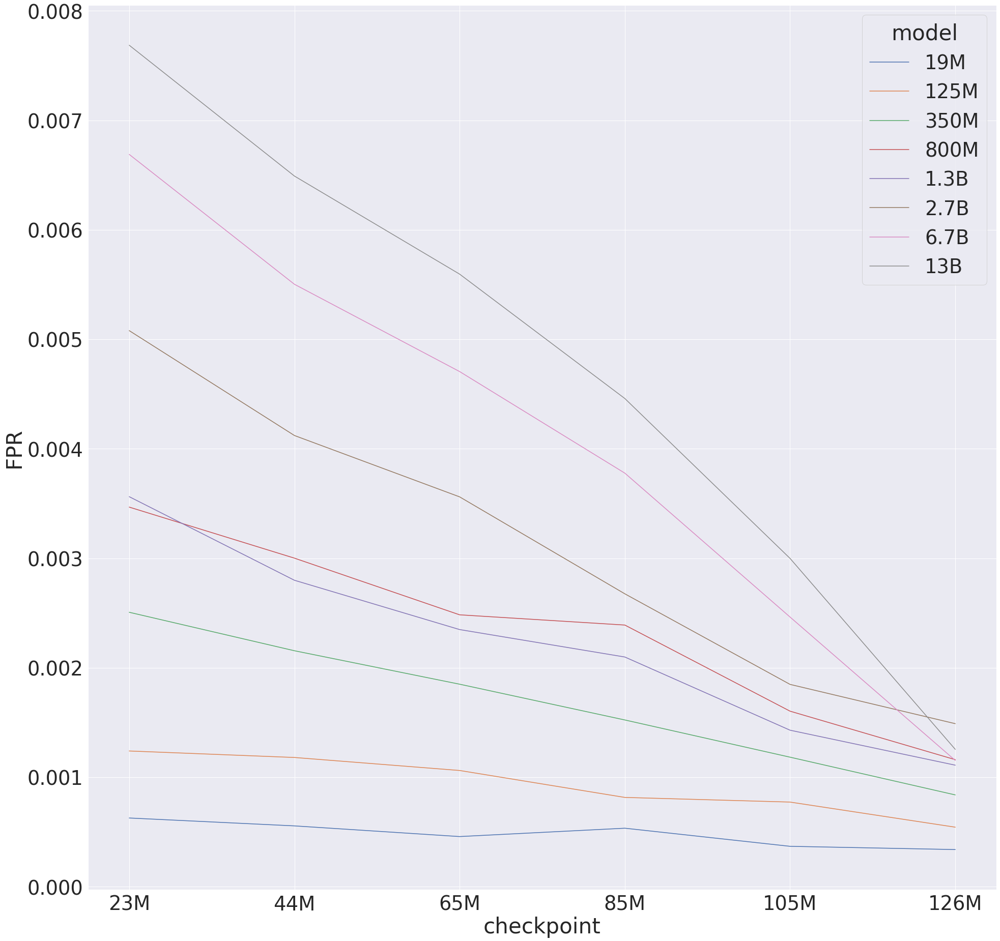

In [12]:
sns.lineplot(data=df, x="checkpoint", y="FPR", hue="model")

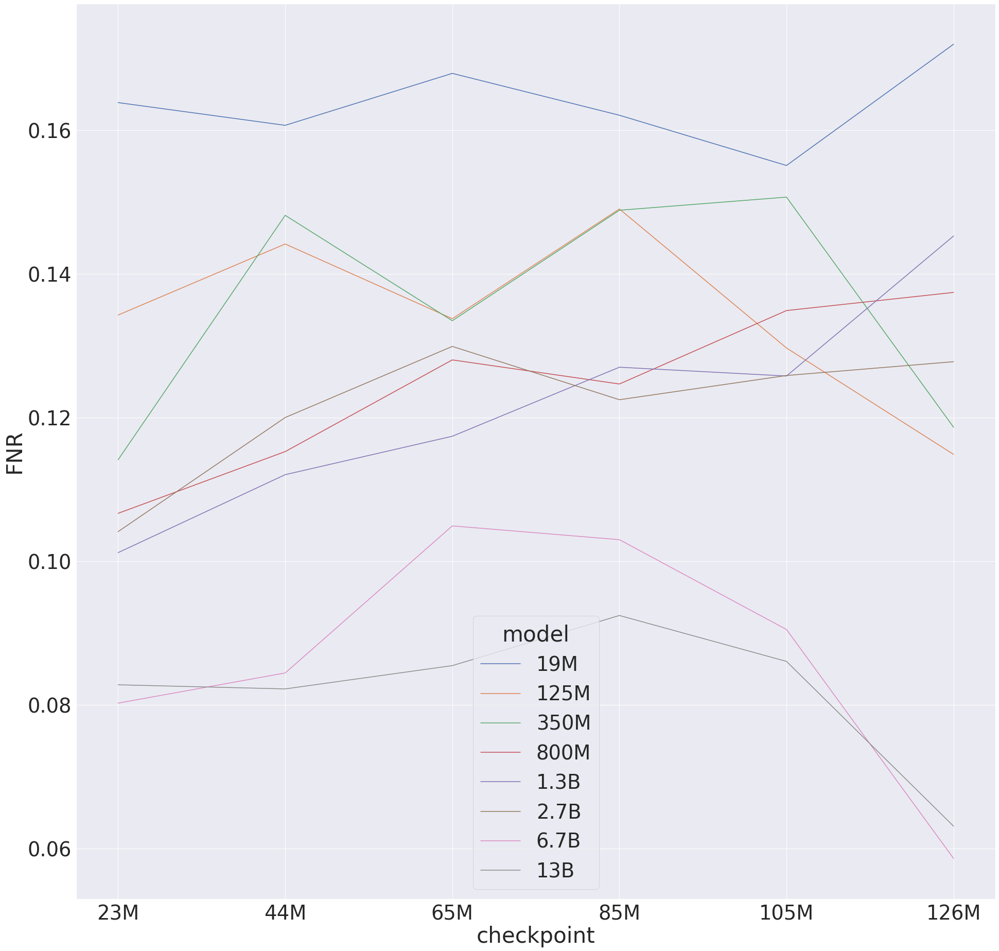

In [13]:
sns.lineplot(data=df, x="checkpoint", y="FNR", hue="model")

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def rate_of_memorization(models, checkpoints):

    df = pd.DataFrame(
        data={
            "checkpoint": [],
            "model": [],
            "num_memorization": [],
        }
    )

    # We only consider Sequence indicies that are evaluated by all checkpoints
    max_sequence_index = 23000*1024
    for model in models:
        
        for checkpoint in checkpoints:
            evals = memorization_results[f'{model}-{checkpoint}']    
            evals = evals[evals['index'] <= max_sequence_index]
            prediction = evals['accuracy'] == 1

            df = df.append(
                {
                    "checkpoint": checkpoint,
                    "model": model,
                    "num_memorization": prediction.sum(),
                },
                ignore_index=True
            )
    return df

In [ ]:
df = rate_of_memorization(models, checkpoints)
sns.lineplot(data=df, x="checkpoint", y="num_memorization", hue="model")

In [57]:
def forgetting_memorization_through_time(models, checkpoints):

    df = pd.DataFrame(
        data={
            "checkpoint": [],
            "model": [],
            "num_memorization": [],
        }
    )

    # We only consider Sequence indicies that are evaluated by all checkpoints
    max_sequence_index = 23000*1024
    for model in models:
        
        for idx, checkpoint in enumerate(checkpoints):
            evals = memorization_results[f'{model}-{checkpoint}']    
            evals = evals[evals['index'] <= max_sequence_index]

            if idx == 0:
                base_index = evals[evals['accuracy'] == 1].index
            
            prediction = evals.iloc[base_index]['accuracy'].sum()

            df = df.append(
                {
                    "checkpoint": checkpoint,
                    "model": model,
                    "num_memorization": prediction,
                },
                ignore_index=True
            )
    return df

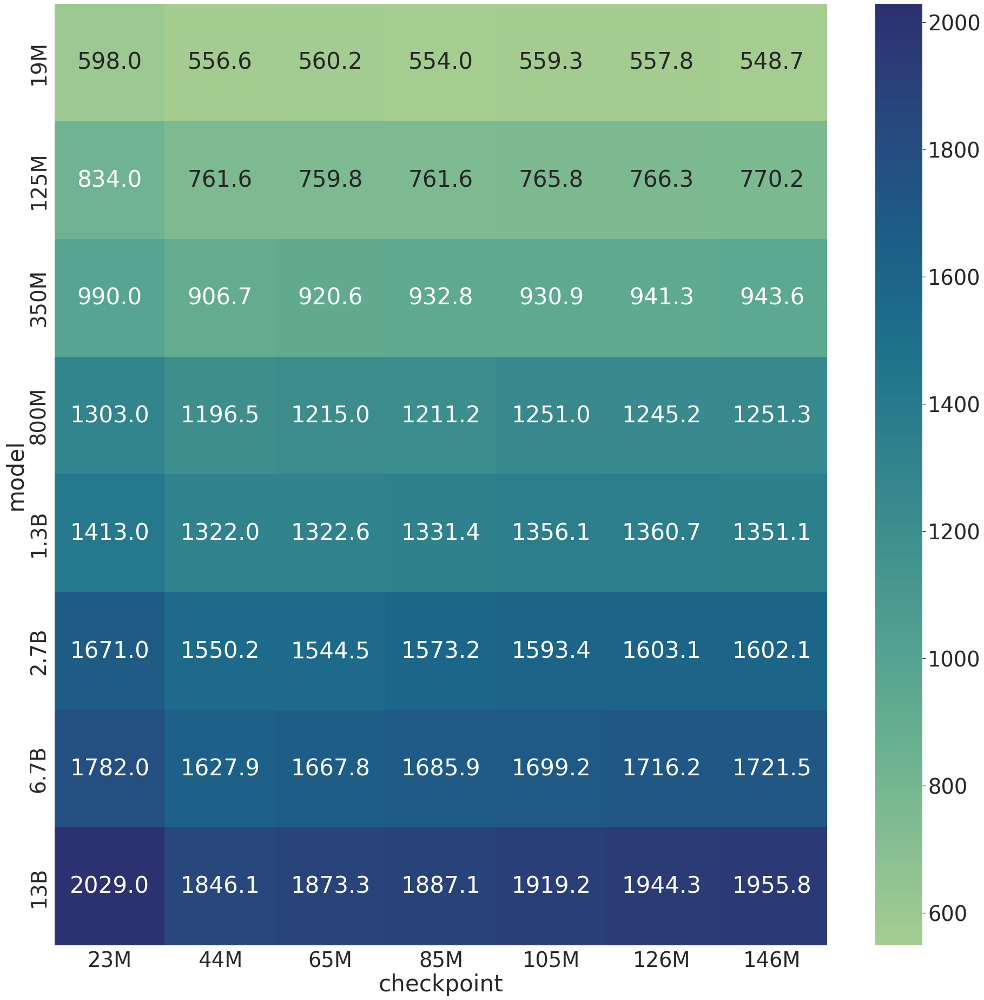

In [63]:
df = forgetting_memorization_through_time(models, checkpoints)
df = df.pivot("model", "checkpoint", "num_memorization")
df = df.reindex(index=models, columns=checkpoints)

sns.heatmap(df, cmap="crest", annot=True, fmt=".1f")

In [59]:
forgetting_memorization_through_time(models, checkpoints)

,checkpoint,model,num_memorization
0,23M,19M,598.00000
1,44M,19M,556.62500
2,65M,19M,560.25000
3,85M,19M,554.03125
4,105M,19M,559.31250
5,126M,19M,557.81250
6,146M,19M,548.65625
7,23M,125M,834.00000
8,44M,125M,761.56250
9,65M,125M,759.75000
